# 100,000 UK Used Car Dataset Regression with Supervised Learning

# Bussiness Understanding
## Business and Problem Statement
lalalala

## Data Availability
Data yang dimiliki hanya terbatas mobil yang dijual terlepas dari apakah mobil tersebut telah terjual maupun tidak. Kami akan menggunakan pola dari brand, model, dan spesifikasi mobil dengan harga jualnya untuk memprediksi harga jual mobil. 

## Analytic Approach
Machine Learning dengan tipe Supervised Learning Regression menjadi metode kami untuk memprediksi harga mobil. Data yang sudah dibersihkan akan dibagi menjadi 3 yaitu : Data Train, Data Validation, dan Data Test. Nantinya Data Test akan diambil sebagian sebagai tolak ukur pengaruh model terhadap keuntungan perusahaan. Untuk pelatihan dan validasi akan diiterasi sebanyak 5 kali agar dapat mendapatkan hasil yang konsisten. Evaluasi dilakukan dengan membandingkan R Square antar model. Setelah diketahui model-model terbaik, akan dilakukan hyperparameter tuning dengan menggunakan 2 metode yaitu GridSearch dan RandomSearch agar dapat meraih hasil prediksi yang optimal. <br> <br>
Kekeliruan dalam prediksi dapat menyebabkan dampak seperti berikut : <br>
1. Ketika hasil prediksi yang dilakukan jauh dibawah harga pasar. Maka perusahaan berpotensi untuk kehilangan keuntungan karena sesungguhnya mobil dapat dijual dengan harga yang lebih tinggi.
2. Ketika hasil prediksi yang dilakukan melebihi harga pasar. Maka mobil yang tersebut mempunyai peluang terjual yang sangat sedikit.

# Data Understanding
Kami menggunakan Dataset “100,000 UK Used Car Data set” yang ada di Kaggle. Dataset tersebut berisi data mobil yang dijual yang ada di UK dari tahun 1970 hingga 2020. Dataset tersebut mempunyai 9 variabel termasuk 1 label “price” di dalamnya. Berikut adalah detail dari variabel yang ada :



Dan berikut adalah rincian dari label dataset :

Nama		: price <br>
Tipe Data 	: float <br>
Deskripsi	: Harga mobil satuan.

In [2]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pingouin as pg

import warnings
warnings.filterwarnings('ignore')

# Getting Data

In [14]:
audi = pd.read_csv("data/audi.csv")
bmw = pd.read_csv("data/bmw.csv")
cclass = pd.read_csv("data/cclass.csv")
focus = pd.read_csv("data/focus.csv")
ford = pd.read_csv("data/ford.csv")
hyundi = pd.read_csv("data/hyundi.csv")
merc = pd.read_csv("data/merc.csv")
skoda = pd.read_csv("data/skoda.csv")
toyota = pd.read_csv("data/toyota.csv")
vauxhall = pd.read_csv("data/vauxhall.csv")
vw = pd.read_csv("data/vw.csv")

u_cclass = pd.read_csv("data/unclean cclass.csv")
u_focus = pd.read_csv("data/unclean focus.csv")

In [15]:
## Menghilangkan Spasi di awal setiap categoric value

cat_cols = list(merc.select_dtypes(include='object').columns)

brand = [audi, bmw, cclass, focus, ford, hyundi, merc, skoda, toyota, vauxhall, vw]

for i in brand :

    i[cat_cols] = i[cat_cols].apply(lambda x: x.str.strip())

In [16]:
## Penggabungan dataframe merc dan cclass karena cclass adalah salah satu model dari merc

full_merc = pd.concat([merc,cclass]).reset_index(drop=True)
full_merc

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize
0,SLK,2005,5200,Automatic,63000,Petrol,325.0,32.1,1.8
1,S Class,2017,34948,Automatic,27000,Hybrid,20.0,61.4,2.1
2,SL CLASS,2016,49948,Automatic,6200,Petrol,555.0,28.0,5.5
3,G Class,2016,61948,Automatic,16000,Petrol,325.0,30.4,4.0
4,G Class,2016,73948,Automatic,4000,Petrol,325.0,30.1,4.0
...,...,...,...,...,...,...,...,...,...
17013,C Class,2017,14700,Manual,31357,Diesel,NaN,NaN,1.6
17014,C Class,2018,18500,Automatic,28248,Diesel,NaN,NaN,2.1
17015,C Class,2014,11900,Manual,48055,Diesel,NaN,NaN,2.1
17016,C Class,2014,11300,Automatic,49865,Diesel,NaN,NaN,2.1


In [17]:
## Penggabungan dataframe ford dan focus karena focus adalah salah satu model dari ford

full_ford = pd.concat([ford,focus]).reset_index(drop=True)
full_ford

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize
0,Fiesta,2017,12000,Automatic,15944,Petrol,150.0,57.7,1.0
1,Focus,2018,14000,Manual,9083,Petrol,150.0,57.7,1.0
2,Focus,2017,13000,Manual,12456,Petrol,150.0,57.7,1.0
3,Fiesta,2019,17500,Manual,10460,Petrol,145.0,40.3,1.5
4,Fiesta,2019,16500,Automatic,1482,Petrol,145.0,48.7,1.0
...,...,...,...,...,...,...,...,...,...
23414,Focus,2019,18745,Manual,7855,Diesel,NaN,NaN,2.0
23415,Focus,2019,16350,Manual,13891,Petrol,NaN,NaN,1.0
23416,Focus,2019,16850,Manual,13452,Petrol,NaN,NaN,1.0
23417,Focus,2019,17310,Automatic,13376,Petrol,NaN,NaN,1.0


In [18]:
## Menambah kolom brand pada masing-masing dataframe

audi['brand'] = "Audi"
bmw['brand'] = "BMW"
full_ford['brand'] = "Ford"
hyundi['brand'] = "Hyundi"
full_merc['brand'] = "Merc"
skoda['brand'] = "Skoda"
toyota['brand'] = "Toyota"
vauxhall['brand'] = "Vauxhall"
vw['brand'] = "VW"

In [19]:
hyundi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4860 entries, 0 to 4859
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         4860 non-null   object 
 1   year          4860 non-null   int64  
 2   price         4860 non-null   int64  
 3   transmission  4860 non-null   object 
 4   mileage       4860 non-null   int64  
 5   fuelType      4860 non-null   object 
 6   tax(£)        4860 non-null   int64  
 7   mpg           4860 non-null   float64
 8   engineSize    4860 non-null   float64
 9   brand         4860 non-null   object 
dtypes: float64(2), int64(4), object(4)
memory usage: 379.8+ KB


In [20]:
## Mengubah nama kolom tax pada dataframe hyundi
hyundi.rename(columns = {"tax(£)" : "tax"}, inplace = True)
hyundi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4860 entries, 0 to 4859
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         4860 non-null   object 
 1   year          4860 non-null   int64  
 2   price         4860 non-null   int64  
 3   transmission  4860 non-null   object 
 4   mileage       4860 non-null   int64  
 5   fuelType      4860 non-null   object 
 6   tax           4860 non-null   int64  
 7   mpg           4860 non-null   float64
 8   engineSize    4860 non-null   float64
 9   brand         4860 non-null   object 
dtypes: float64(2), int64(4), object(4)
memory usage: 379.8+ KB


# Diambil 10% dari setiap brand untuk dijadikan test akhir.

In [305]:
cat_cols = list(merc.columns)
brand = [audi, bmw, full_ford, hyundi, full_merc, skoda, toyota, vauxhall, vw]
df_finaltest = pd.DataFrame(columns=cat_cols)

for i in brand :

    ## Take sample
    temp = i.sample(frac = .1)
    ## append to another dataframe
    df_finaltest = pd.concat([df_finaltest, temp])
    ## drop data from initial dataframe
    i.drop(temp.index, inplace = True)

    

df_finaltest.reset_index(inplace = True)
df_finaltest

,index,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
0,2306,A1,2013,9750,Manual,29773,Petrol,125,52.3,1.4,Audi
1,5549,A3,2017,18900,Manual,10950,Petrol,150,54.3,1.5,Audi
2,10483,A3,2019,21000,Manual,3000,Diesel,145,52.3,1.6,Audi
3,4504,Q5,2019,31490,Automatic,6000,Diesel,145,39.2,2.0,Audi
4,779,A5,2015,14998,Manual,32125,Diesel,125,57.6,2.0,Audi
...,...,...,...,...,...,...,...,...,...,...,...
10850,11682,Tiguan,2015,12799,Manual,42030,Diesel,160,48.7,2.0,VW
10851,3464,Golf,2016,12190,Manual,24397,Diesel,20,68.9,2.0,VW
10852,12114,Sharan,2017,20990,Automatic,20000,Diesel,150,53.3,2.0,VW
10853,11850,Tiguan,2016,11995,Manual,11000,Diesel,145,53.3,2.0,VW


Sebanyak 10855 data akan masuk test akhir.

In [306]:
df = pd.concat([audi, bmw, full_ford, hyundi, full_merc, skoda, toyota, vauxhall, vw], ignore_index=True)
df

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
0,A1,2017,12500,Manual,15735,Petrol,150.0,55.4,1.4,Audi
1,A6,2016,16500,Automatic,36203,Diesel,20.0,64.2,2.0,Audi
2,A1,2016,11000,Manual,29946,Petrol,30.0,55.4,1.4,Audi
3,A1,2016,13900,Automatic,32260,Petrol,30.0,58.9,1.4,Audi
4,A6,2016,13250,Automatic,76788,Diesel,30.0,61.4,2.0,Audi
...,...,...,...,...,...,...,...,...,...,...
97680,Eos,2006,2995,Manual,92640,Diesel,200.0,48.0,2.0,VW
97681,Eos,2012,5990,Manual,74000,Diesel,125.0,58.9,2.0,VW
97682,Fox,2008,1799,Manual,88102,Petrol,145.0,46.3,1.2,VW
97683,Fox,2009,1590,Manual,70000,Petrol,200.0,42.0,1.4,VW


Tabel di atas merupakan hasil dari penggabungan dataframe antar brand yg akan dianalisis

In [307]:
# df.to_csv("divided_sim_data/df.csv")
# df_finaltest.to_csv("divided_sim_data/df_finaltest.csv")

# EDA

In [ ]:
# df = pd.read_csv("divided_sim_data/df.csv", index_col=[0])
# df_finaltest = pd.read_csv("divided_sim_data/df_finaltest.csv", index_col=[0])

In [308]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97685 entries, 0 to 97684
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         97685 non-null  object 
 1   year          97685 non-null  int64  
 2   price         97685 non-null  int64  
 3   transmission  97685 non-null  object 
 4   mileage       97685 non-null  int64  
 5   fuelType      97685 non-null  object 
 6   tax           89248 non-null  float64
 7   mpg           89248 non-null  float64
 8   engineSize    97685 non-null  float64
 9   brand         97685 non-null  object 
dtypes: float64(3), int64(3), object(4)
memory usage: 7.5+ MB


Missing Value hanya terdapat di kolom tax dan mpg.

In [309]:
df.describe()

,year,price,mileage,tax,mpg,engineSize
count,97685.000000,97685.000000,97685.000000,89248.000000,89248.000000,97685.000000
mean,2017.101162,16905.044080,23000.842535,120.326954,55.161483,1.662627
std,2.128514,9781.096647,21171.865620,63.286993,16.167909,0.558260
min,1970.000000,450.000000,1.000000,0.000000,0.300000,0.000000
25%,2016.000000,10248.000000,7459.000000,125.000000,47.100000,1.200000
50%,2017.000000,14699.000000,17226.000000,145.000000,54.300000,1.600000
75%,2019.000000,20950.000000,32199.000000,145.000000,62.800000,2.000000
max,2060.000000,159999.000000,323000.000000,580.000000,470.800000,6.600000


In [310]:
df.describe()

,year,price,mileage,tax,mpg,engineSize
count,97685.000000,97685.000000,97685.000000,89248.000000,89248.000000,97685.000000
mean,2017.101162,16905.044080,23000.842535,120.326954,55.161483,1.662627
std,2.128514,9781.096647,21171.865620,63.286993,16.167909,0.558260
min,1970.000000,450.000000,1.000000,0.000000,0.300000,0.000000
25%,2016.000000,10248.000000,7459.000000,125.000000,47.100000,1.200000
50%,2017.000000,14699.000000,17226.000000,145.000000,54.300000,1.600000
75%,2019.000000,20950.000000,32199.000000,145.000000,62.800000,2.000000
max,2060.000000,159999.000000,323000.000000,580.000000,470.800000,6.600000


1. Untuk variable year, perlu diperhatikan bahwa terdapat tahun 2060 yang merupakan anomali dan memiliki nilai minimal di tahun 1970. <br>
2. Untuk variable mileage, terdapat angka minimal 1 yang berarti mobil yang dijual merupakan mobil yang baru dibeli atau hampir tidak digunakan. <br>
3. Untuk variable mpg, terdapat nilai minimal 0.3 yang merupakan data anomali. <br>

## Histogram variable numeric

In [311]:
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

In [312]:
fig = make_subplots(
    rows=2, cols=2, 
    start_cell="top-left",
    subplot_titles=("price", "mileage", "mpg"))

fig.add_trace(
    go.Histogram(x=df['price'], name="price"),     
    row=1, col=1)

fig.add_trace(
    go.Histogram(x=df['mileage'], name="mileage"),
    row=1, col=2)

fig.add_trace(
    go.Histogram(x=df['mpg'], name="mpg"),
    row=2, col=1)

fig.update_xaxes(range=[0, 60000], row=1, col=1)
fig.update_xaxes(range=[0, 100000], row=1, col=2)
fig.update_xaxes(range=[0, 200], row=2, col=1)

fig.update_layout(
    autosize=False,
    width=1500,
    height=800,
    title = "Histogram Variable Numeric")

fig.show()

1. Terlihat dari grafik berikut, bahwa distribusi kolom price, mileage, dan mpg berbentuk right-skewed. <br>
2. Untuk variable milage, terdapat nilai dominan mendekati 0 yang berarti mobil tersebut termasuk baru dibeli atau hampir tidak pernah digunakan. <br>

Untuk variable tax dan engineSize, digunakan barplot karena kedua variable tersebut mempunyai ketentuan tersendiri sehingga bukan merupakan data continous.

In [313]:
tax = df['tax'].nunique()
engineSize = df['engineSize'].nunique()

print(f"Variable tax mempunyai nilai unik sebanyak {tax}")
print(f"Sedangkan variable engineSize mempunyai nilai unik sebanyak {engineSize}")

Variable tax mempunyai nilai unik sebanyak 47
Sedangkan variable engineSize mempunyai nilai unik sebanyak 41


In [314]:
n_tax = df['tax'].value_counts().head(10)
n_engineSize = df['engineSize'].value_counts().head(10)

layout = go.Layout(xaxis=dict(type='category'))

fig = make_subplots(
    rows=2, cols=1, 
    start_cell="top-left",
    subplot_titles=("tax", "engineSize"))

fig.add_trace(
    go.Bar(
        y=n_tax.values, 
        x=n_tax.index, 
        name="tax",
        text=n_tax.values,
        textposition='auto'),    
    row=1, col=1)

fig.add_trace(
    go.Bar(
        y=n_engineSize.values, 
        x=n_engineSize.index, 
        marker_color = "green",
        name="engineSize",
        text=n_engineSize.values,
        textposition='auto'),
    row=2, col=1)

fig.update_layout(
    autosize=False,
    width=1600,
    height=1200,
    title="Persebaran Tipe tax dan engineSize (Top 10)")

fig.update_xaxes(type = "category")

fig.show()

1. Untuk variable tax, nilai pajak terbanyak ada pada angka 145 pounds. Kuantitas Tipe pajak urutan pertama dan kedua terbanyak selisihnya sangat jauh.  <br>
2. Sedangkan untuk variable engineSize, varian terbanyak adalah mobil dengan ukuran mesin 2 L lalu disusul dengan varian 1 L.

## Box Plot variable numeric

In [315]:
fig = make_subplots(
    rows=2, cols=3, 
    start_cell="top-left",
    subplot_titles=("price", "mileage", "tax", "mpg", "engineSize"))

fig.add_trace(
    go.Box(y=df['price'], name="price"),    
    row=1, col=1)

fig.add_trace(
    go.Box(y=df['mileage'], name="mileage"),
    row=1, col=2)

fig.add_trace(
    go.Box(y=df['tax'], name="tax"),
    row=1, col=3)

fig.add_trace(
    go.Box(y=df['mpg'], name="mpg"),
    row=2, col=1)

fig.add_trace(
    go.Box(y=df['engineSize'], name="engineSize"),
    row=2, col=2)

fig.update_layout(
    autosize=False,
    width=1600,
    height=1000,
    title = "Boxplot untuk Variable Numeric")

fig.show()



In [316]:
corr = df.corr(method = "spearman")
corr

,year,price,mileage,tax,mpg,engineSize
year,1.000000,0.605386,-0.814225,0.329191,-0.328149,-0.042146
price,0.605386,1.000000,-0.522849,0.316315,-0.393006,0.573697
mileage,-0.814225,-0.522849,1.000000,-0.263148,0.336823,0.104088
tax,0.329191,0.316315,-0.263148,1.000000,-0.576565,0.163699
mpg,-0.328149,-0.393006,0.336823,-0.576565,1.000000,-0.206679
engineSize,-0.042146,0.573697,0.104088,0.163699,-0.206679,1.000000


<AxesSubplot:title={'center':'Korelasi Antar Variable Numerik'}>

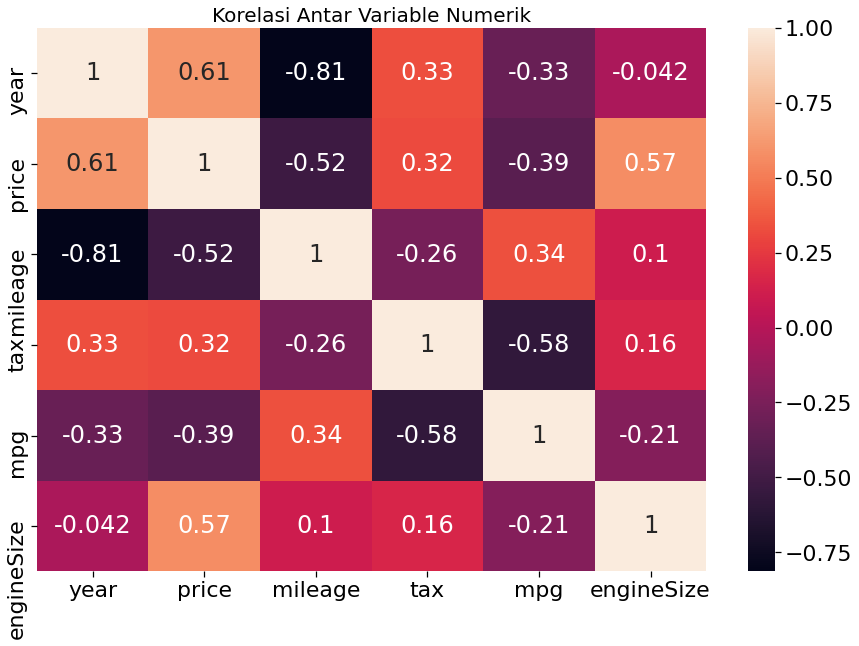

In [317]:
plt.figure (figsize=(15,10))
plt.title("Korelasi Antar Variable Numerik", size = 20)
sns.heatmap(corr, annot=True)

1. Terdapat korelasi yang cukup signifikan (dalam bentuk negatif) antara variable mileage dan juga variable year. Yang mana berarti jarak tempuh yang semakin jauh apabila tahun rilis mobil semakin kecil. <br>
2. Ada 2 variable yang cukup berpengaruh terhadap variable price yaitu variable year dan juga variable engineSize. Kedua variable tersebut mempunyai korelasi positif terhadap variable price.

## Barplot untuk variabel kategorik

In [318]:
n_transmission = df['transmission'].value_counts(ascending = False)
n_fuelType = df['fuelType'].value_counts(ascending = False)
n_year = df['year'].value_counts()

fig = make_subplots(
    rows=3, cols=1, 
    start_cell="top-left",
    subplot_titles=("transmission", "fuelType", "year"))

fig.add_trace(
    go.Bar(
        y=n_transmission.values, 
        x=n_transmission.index, 
        name="transmission",
        text=n_transmission.values,
        textposition='auto'),    
    row=1, col=1)

fig.add_trace(
    go.Bar(
        y=n_fuelType.values, 
        x=n_fuelType.index, 
        marker_color = "purple",
        name="fuelType",
        text=n_fuelType.values,
        textposition='auto'),   
    row=2, col=1)

fig.add_trace(
    go.Bar(
        y=n_year.values, 
        x=n_year.index, 
        name="year",
        text=n_year.values,
        textposition='auto'),    
    row=3, col=1)

fig.update_layout(
    autosize=False,
    width=1600,
    height=1200,
    title = "Persebaran untuk Variable Kategorik")

fig.update_xaxes(range=[1999, 2021], row=3, col=1)
fig.update_xaxes(tickvals=df['year'], row=3, col=1)

fig.show()

1. Transmisi manual masih menjadi unit mobil yang dijual paling banyak. Dibawahnya ada dua tipe transmisi yang memiliki jumlah unit yang tidak begitu jauh yaitu semi-auto dan juga automatic. <br>
2. Untuk variable fuelType, Petrol dan Diesel menjadi jenis bahan bakar terbanyak jauh meninggalkan hybrid dan electric.
3. Pada setiap tahun rilis, jumlah mobil yang dijual mengalami peningkatan, namun pengecualian untuk tahun 2018 dan 2020 yang mengalami penurunan dari tahun sebelumnya.

# Cleaning

## Cleaning duplicate pada merc dan cclass

In [1370]:
## Dapatkan ID dari yg duplicate khusus model C Class tanpa tax dan mpg

duplicated_idx_cclass = df[df['model']=='C Class'].index[df[df['model']=='C Class'].duplicated(list(cclass.columns))]
len(duplicated_idx_cclass)

2989

In [1371]:
## Drop data dengan ID tersebut

df = df.drop(duplicated_idx_cclass,0)
df

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
0,A1,2017,12500,Manual,15735,Petrol,150.0,55.4,1.4,Audi
1,A6,2016,16500,Automatic,36203,Diesel,20.0,64.2,2.0,Audi
2,A1,2016,11000,Manual,29946,Petrol,30.0,55.4,1.4,Audi
3,A1,2016,13900,Automatic,32260,Petrol,30.0,58.9,1.4,Audi
4,A6,2016,13250,Automatic,76788,Diesel,30.0,61.4,2.0,Audi
...,...,...,...,...,...,...,...,...,...,...
97680,Eos,2006,2995,Manual,92640,Diesel,200.0,48.0,2.0,VW
97681,Eos,2012,5990,Manual,74000,Diesel,125.0,58.9,2.0,VW
97682,Fox,2008,1799,Manual,88102,Petrol,145.0,46.3,1.2,VW
97683,Fox,2009,1590,Manual,70000,Petrol,200.0,42.0,1.4,VW


## Cleaning duplicate pada ford dan focus

In [1372]:
## Dapatkan ID dari yg duplicate khusus model Focus tanpa tax dan mpg

duplicated_idx_focus = df[df['model']=='Focus'].index[df[df['model']=='Focus'].duplicated(list(focus.columns))]
len(duplicated_idx_focus)

4163

In [1373]:
## Drop data dengan ID tersebut

df = df.drop(duplicated_idx_focus,0)
df

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
0,A1,2017,12500,Manual,15735,Petrol,150.0,55.4,1.4,Audi
1,A6,2016,16500,Automatic,36203,Diesel,20.0,64.2,2.0,Audi
2,A1,2016,11000,Manual,29946,Petrol,30.0,55.4,1.4,Audi
3,A1,2016,13900,Automatic,32260,Petrol,30.0,58.9,1.4,Audi
4,A6,2016,13250,Automatic,76788,Diesel,30.0,61.4,2.0,Audi
...,...,...,...,...,...,...,...,...,...,...
97680,Eos,2006,2995,Manual,92640,Diesel,200.0,48.0,2.0,VW
97681,Eos,2012,5990,Manual,74000,Diesel,125.0,58.9,2.0,VW
97682,Fox,2008,1799,Manual,88102,Petrol,145.0,46.3,1.2,VW
97683,Fox,2009,1590,Manual,70000,Petrol,200.0,42.0,1.4,VW


## Remove Dupplicate model lain

In [1374]:
## Remove Duplicate Semua Kolom

df.drop_duplicates(inplace = True)
df.reset_index(inplace = True, drop=True)
df

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
0,A1,2017,12500,Manual,15735,Petrol,150.0,55.4,1.4,Audi
1,A6,2016,16500,Automatic,36203,Diesel,20.0,64.2,2.0,Audi
2,A1,2016,11000,Manual,29946,Petrol,30.0,55.4,1.4,Audi
3,A1,2016,13900,Automatic,32260,Petrol,30.0,58.9,1.4,Audi
4,A6,2016,13250,Automatic,76788,Diesel,30.0,61.4,2.0,Audi
...,...,...,...,...,...,...,...,...,...,...
89348,Eos,2006,2995,Manual,92640,Diesel,200.0,48.0,2.0,VW
89349,Eos,2012,5990,Manual,74000,Diesel,125.0,58.9,2.0,VW
89350,Fox,2008,1799,Manual,88102,Petrol,145.0,46.3,1.2,VW
89351,Fox,2009,1590,Manual,70000,Petrol,200.0,42.0,1.4,VW


In [1375]:
# ## Pembagian train-test data

X = df.drop('price',axis=1)
y = df['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.15, random_state=800)

In [1376]:
# Penggabungan kembali X_train dan y_train untuk Cleaning dan EDA

df = pd.concat([X_train, y_train], axis=1)
df

,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,brand,price
17703,3 Series,2017,Automatic,41741,Diesel,150.0,51.4,3.0,BMW,21988
48608,C Class,2016,Automatic,25000,Petrol,300.0,34.0,3.0,Merc,33500
57988,GT86,2016,Manual,28321,Petrol,265.0,36.2,2.0,Toyota,15000
25991,Focus,2017,Manual,23900,Petrol,145.0,60.1,1.0,Ford,10650
21365,Fiesta,2016,Manual,12118,Petrol,125.0,54.3,1.2,Ford,8998
...,...,...,...,...,...,...,...,...,...,...
3871,A1,2020,Semi-Auto,5000,Petrol,145.0,44.8,1.5,Audi,23000
65039,Corsa,2017,Manual,26813,Petrol,145.0,55.4,1.4,Vauxhall,7695
1439,A1,2015,Manual,22148,Petrol,200.0,40.4,2.0,Audi,15888
71891,Mokka X,2019,Manual,18261,Petrol,145.0,39.2,1.4,Vauxhall,14420


# Menghilangkan Data Anomali pada kolom year

In [1377]:
df['year'].value_counts().sort_index()

1970        2
1991        1
1995        1
1996        2
1997        4
1998        7
1999        4
2000        6
2001       16
2002       25
2003       29
2004       44
2005       58
2006       70
2007      131
2008      170
2009      240
2010      265
2011      332
2012      499
2013     1989
2014     3154
2015     5863
2016    12164
2017    16725
2018    10546
2019    20497
2020     3105
2060        1
Name: year, dtype: int64

In [1378]:
df[(df['year'] <= 1995) | (df['year'] > 2020)]

,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,brand,price
73432,Zafira,1970,Manual,37357,Petrol,200.0,42.2,1.4,Vauxhall,10495
50874,M Class,1970,Automatic,14000,Diesel,305.0,39.2,0.0,Merc,24999
52290,C Class,1995,Automatic,173000,Petrol,NaN,NaN,3.6,Merc,4750
34926,Fiesta,2060,Automatic,54807,Petrol,205.0,42.8,1.4,Ford,6495
52281,C Class,1991,Automatic,170000,Petrol,NaN,NaN,3.0,Merc,4450


Anomali terdapat pada id :
1. 34926 dikarenakan tidak mungkin mobil buatan tahun 2060 ada pada list.
2. 50874 dikarenakan merc M Class mulai rilis tahun 1997
3. 52281 dikarenakan merc C Class mulai rilis tahun 1993
4. 73432 Vauxhall Zafira mulai rilis pada tahun 1999

Dilakukan drop data pada ID tersebut karena sulit untuk mengisi tahun yang benar berdasarkan variabel lain yang tersedia.

In [1379]:
## Mulai drop data anomali pada variabel year dengan ketentuan yang sudah disebutkan

df.drop(index=df[df['year'] > 2021].index, inplace=True)
df.drop(index=df[(df['year'] < 1997) & (df['model'] == 'M Class')].index, inplace=True)
df.drop(index=df[(df['year'] < 1993) & (df['model'] == 'C Class')].index, inplace=True)
df.drop(index=df[(df['year'] < 1999) & (df['model'] == 'Zafira')].index, inplace=True)
df.reset_index(drop=True, inplace=True)
df

,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,brand,price
0,3 Series,2017,Automatic,41741,Diesel,150.0,51.4,3.0,BMW,21988
1,C Class,2016,Automatic,25000,Petrol,300.0,34.0,3.0,Merc,33500
2,GT86,2016,Manual,28321,Petrol,265.0,36.2,2.0,Toyota,15000
3,Focus,2017,Manual,23900,Petrol,145.0,60.1,1.0,Ford,10650
4,Fiesta,2016,Manual,12118,Petrol,125.0,54.3,1.2,Ford,8998
...,...,...,...,...,...,...,...,...,...,...
75941,A1,2020,Semi-Auto,5000,Petrol,145.0,44.8,1.5,Audi,23000
75942,Corsa,2017,Manual,26813,Petrol,145.0,55.4,1.4,Vauxhall,7695
75943,A1,2015,Manual,22148,Petrol,200.0,40.4,2.0,Audi,15888
75944,Mokka X,2019,Manual,18261,Petrol,145.0,39.2,1.4,Vauxhall,14420


# Menghilangkan data anomali pada kolom engineSize

In [1380]:
#Mengecek engineSize yang bernilai 0

df[df['engineSize'] == 0]

,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,brand,price
753,Fiesta,2017,Manual,20000,Petrol,0.0,65.7,0.0,Ford,9080
1037,Meriva,2016,Manual,50254,Petrol,145.0,47.1,0.0,Vauxhall,5998
1455,I10,2017,Manual,16636,Petrol,145.0,60.1,0.0,Hyundi,8000
1766,2 Series,2016,Automatic,17097,Diesel,20.0,68.9,0.0,BMW,15000
2053,Focus,2019,Manual,4000,Petrol,145.0,48.7,0.0,Ford,15999
...,...,...,...,...,...,...,...,...,...,...
74077,T-Roc,2019,Automatic,2009,Petrol,145.0,39.8,0.0,VW,22000
74476,Up,2017,Manual,20324,Petrol,20.0,64.2,0.0,VW,8500
74879,i3,2017,Automatic,41146,Hybrid,0.0,470.8,0.0,BMW,19998
75249,i3,2017,Automatic,10900,Hybrid,140.0,470.8,0.0,BMW,21500


Terdapat 270 data dengan engineSize 0
Untuk fuelType Electric dan Hybrid, angka tersebut wajar.
Maka dilakukan perubahan value untuk mobil yang memiliki fuelType BUKAN Electric dan Hybrid.
Value diubah menjadi median dari grup model, transmission, dan fuelType mobil terkait.

In [1381]:
#Mengecek engineSize yang bernilai 0 dan fuelTypenya bukan merupakan Electric maupun Hybrid

df[(df['engineSize'] == 0) & (~df['fuelType'].isin(['Electric','Hybrid']))]

,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,brand,price
753,Fiesta,2017,Manual,20000,Petrol,0.0,65.7,0.0,Ford,9080
1037,Meriva,2016,Manual,50254,Petrol,145.0,47.1,0.0,Vauxhall,5998
1455,I10,2017,Manual,16636,Petrol,145.0,60.1,0.0,Hyundi,8000
1766,2 Series,2016,Automatic,17097,Diesel,20.0,68.9,0.0,BMW,15000
2053,Focus,2019,Manual,4000,Petrol,145.0,48.7,0.0,Ford,15999
...,...,...,...,...,...,...,...,...,...,...
73053,Focus,2017,Manual,24484,Diesel,145.0,70.6,0.0,Ford,13000
73246,1 Series,2017,Manual,16681,Diesel,150.0,68.9,0.0,BMW,13500
74077,T-Roc,2019,Automatic,2009,Petrol,145.0,39.8,0.0,VW,22000
74476,Up,2017,Manual,20324,Petrol,20.0,64.2,0.0,VW,8500


Terdapat 230 data anomali untuk kolom engineSize

In [1382]:
## Dapatkan median dikelompokkan dari model, transmission, dan fuelType
engine_median = df.groupby(['model', 'transmission', 'fuelType']).median()['engineSize'].reset_index()

#Fungsi untuk menggganti data engineSize jika engineSize memiliki nilai 0 dan fuelTypenya bukan Electric maupun Hybrid
def change_engineSize(cols):
    if (cols['engineSize'] == 0) & ((cols['fuelType'] != "Electric") | (cols['fuelType'] != "Hybrid")) :
        return float(engine_median[(engine_median['model'] == cols['model']) & (engine_median['transmission'] == cols['transmission']) & (engine_median['fuelType'] == cols['fuelType'])]['engineSize'])
    else:
        return cols['engineSize']
        
engine_median

,model,transmission,fuelType,engineSize
0,1 Series,Automatic,Diesel,2.0
1,1 Series,Automatic,Petrol,2.0
2,1 Series,Manual,Diesel,2.0
3,1 Series,Manual,Petrol,1.5
4,1 Series,Semi-Auto,Diesel,2.0
...,...,...,...,...
795,i3,Automatic,Electric,0.0
796,i3,Automatic,Hybrid,0.0
797,i3,Automatic,Other,0.6
798,i8,Automatic,Hybrid,1.5


In [1383]:
## Implementasikan fungsi change_engineSize pada setiap row df

df['engineSize'] = df[['engineSize','model','transmission','fuelType']].apply(change_engineSize, axis = 1)

In [1384]:
#Mengecek engineSize yang bernilai 0 dan fuelTypenya bukan merupakan Electric maupun Hybrid

df[(df['engineSize'] == 0) & (~df['fuelType'].isin(['Electric','Hybrid']))]

,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,brand,price
20746,230,2007,Automatic,94000,Petrol,520.0,29.4,0.0,Merc,4500


Masih terdapat 1 data anomali yang akan diisi secara manual. Setelah mencari referensi, didapatkan data sebagai berikut :

1. Merc 230 tahun 2007 transmisi Automatic dan fuelType Petrol memiliki engineSize 2.5


In [1385]:
## Ganti value engineSize dari sisa 2 data anomali tersebut secara manual

df.loc[(df.model == "230") & (df.year == 2007) & (df.brand == "Merc"), "engineSize"] =  2.5
# df.loc[50219, 'engineSize'] = 2.5


In [1386]:
#Mengecek engineSize yang bernilai 0 dan fuelTypenya bukan merupakan Electric maupun Hybrid

df[(df['engineSize'] == 0) & (~df['fuelType'].isin(['Electric','Hybrid']))]

,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,brand,price


Sudah tidak ada data anomali untuk engineSize

<AxesSubplot:title={'center':'Korelasi Antar Variable Numerik'}>

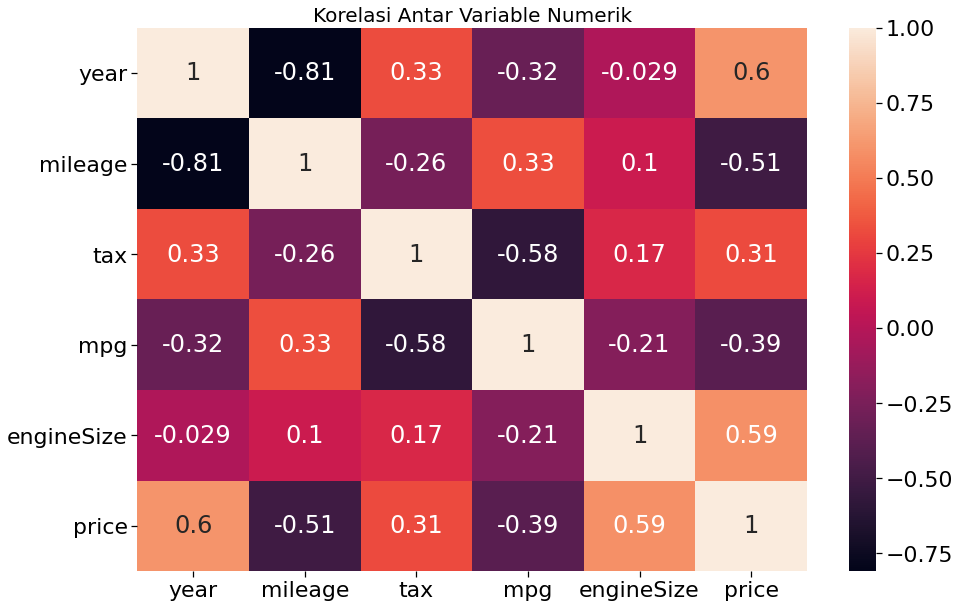

In [1387]:
corr = df.corr(method = "spearman")

plt.figure (figsize=(15,10))
plt.title("Korelasi Antar Variable Numerik", size = 20)
sns.heatmap(corr, annot=True)

Proses cleaning pada kolom engineSize berpengaruh terhadap korelasi engineSize dan price yang mengalami peningkatan dari 0.57 ke 0.59

# Cleaning Data anomali MPG

In [1388]:
df[df['mpg'] < 1]

,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,brand,price
4886,Golf SV,2019,Manual,100,Petrol,145.0,0.3,1.0,VW,17950


Dilakukan drop pada data tersebut karena memiliki mpg yang tidak realistis.

In [1389]:
## Mulai drop data anomali pada variabel mpg

df.drop(index=df[df['mpg'] < 1].index, inplace=True)
df.reset_index(drop=True, inplace=True)
df

,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,brand,price
0,3 Series,2017,Automatic,41741,Diesel,150.0,51.4,3.0,BMW,21988
1,C Class,2016,Automatic,25000,Petrol,300.0,34.0,3.0,Merc,33500
2,GT86,2016,Manual,28321,Petrol,265.0,36.2,2.0,Toyota,15000
3,Focus,2017,Manual,23900,Petrol,145.0,60.1,1.0,Ford,10650
4,Fiesta,2016,Manual,12118,Petrol,125.0,54.3,1.2,Ford,8998
...,...,...,...,...,...,...,...,...,...,...
75940,A1,2020,Semi-Auto,5000,Petrol,145.0,44.8,1.5,Audi,23000
75941,Corsa,2017,Manual,26813,Petrol,145.0,55.4,1.4,Vauxhall,7695
75942,A1,2015,Manual,22148,Petrol,200.0,40.4,2.0,Audi,15888
75943,Mokka X,2019,Manual,18261,Petrol,145.0,39.2,1.4,Vauxhall,14420


In [1390]:
df.isna().sum()

model              0
year               0
transmission       0
mileage            0
fuelType           0
tax             1160
mpg             1160
engineSize         0
brand              0
price              0
dtype: int64

In [1391]:
df[~df['model'].isin(['C Class', 'Focus'])].isna().sum()

model           0
year            0
transmission    0
mileage         0
fuelType        0
tax             0
mpg             0
engineSize      0
brand           0
price           0
dtype: int64

Missing Value hanya ada di model C Class dan Focus

# Missing Value

## Missing Value pada kolom tax

In [1392]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from scipy import stats

In [1393]:
## Dengan Central Limit Theorem, lihat apakah kolom model berpengaruh pada jumlah tax mobil dengan menggunakan ANOVA

model = ols('tax ~ model', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
model,6.258585e+07,192.0,101.42079,0.0
Residual,2.397398e+08,74592.0,NaN,NaN


Terbukti bahwa model mempengaruhi jumlah tax mobil (Pval < 0.05).

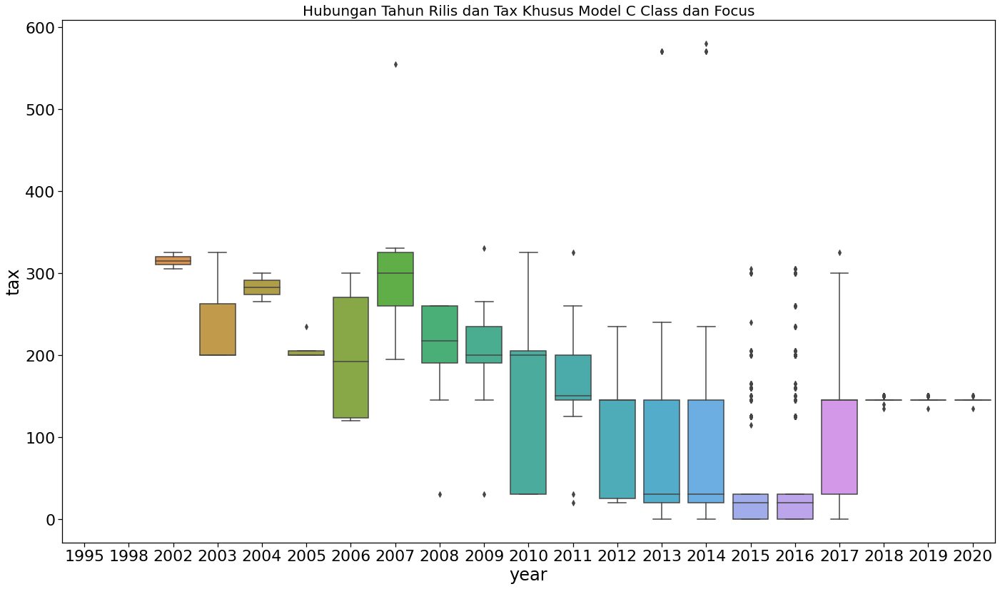

In [1394]:
## Hubungan year dan tax khusus model C Class dan Focus

plt.figure(figsize=(20,12))
sns.boxplot(x='year',y='tax', data=df[df['model'].isin(['C Class','Focus'])])
plt.title("Hubungan Tahun Rilis dan Tax Khusus Model C Class dan Focus", size = 20)
plt.tight_layout()

1. Untuk tahun 2018-2020 data tax cenderung seragam dengan outlier yang tidak terlalu melenceng.
2. Untuk tahun 2013-2017 tax juga cenderung seragam dengan beberapa outlier.
3. Untuk sebelum tahun 2013, tax cenderung meningkat seiring dengan semakin lama tahun rilis mobilnya.
4. Tahun 2005 ke bawah memiliki nilai tax yang cenderung stabil dan tidak mengalami trend peningkatan kembali. 

## Mengisi Missing Value pada Kolom MPG

In [1395]:
## Dengan Central Limit Theorem, lihat apakah kolom model berpengaruh pada mpg mobil dengan menggunakan ANOVA

model_mpg = ols('mpg ~ model', data=df).fit()
anova_table = sm.stats.anova_lm(model_mpg, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
model,9.811252e+06,192.0,368.568786,0.0
Residual,1.034182e+07,74592.0,NaN,NaN


TERBUKTI bahwa terdapat pengaruh mpg dengan model terkait (PVAL < 0.05).

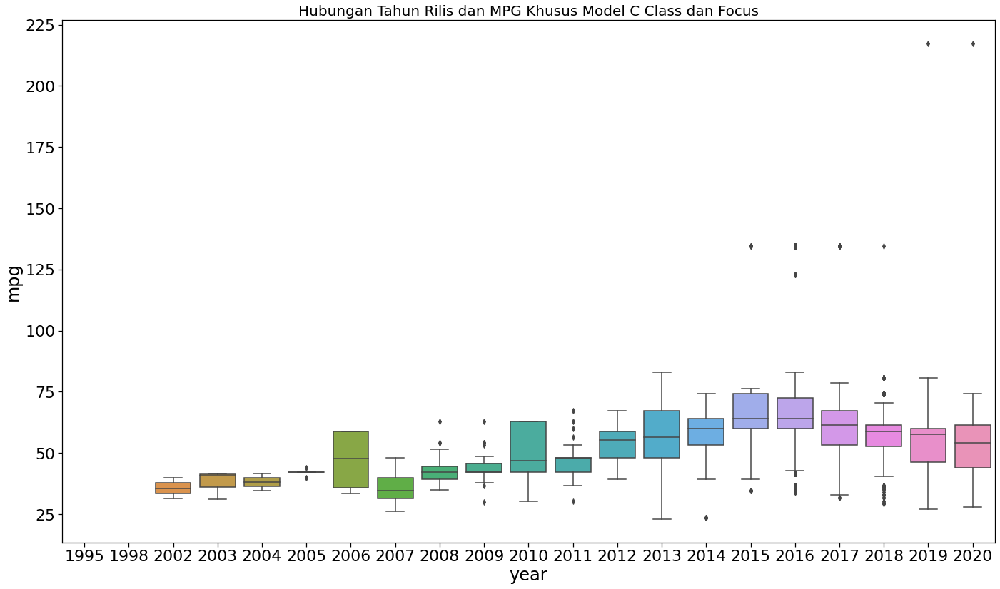

In [1396]:
## Grafik hubungan tahun rilis dengan mpg focus dan C Class

plt.figure(figsize=(20,12))
sns.boxplot(x='year',y='mpg', data=df[df['model'].isin(['C Class','Focus'])])
plt.title("Hubungan Tahun Rilis dan MPG Khusus Model C Class dan Focus", size = 20)
plt.tight_layout()

Terlihat dari boxplot diatas bahwa tahun rilis tidak mempunyai pengaruh signifikan ke mpg.

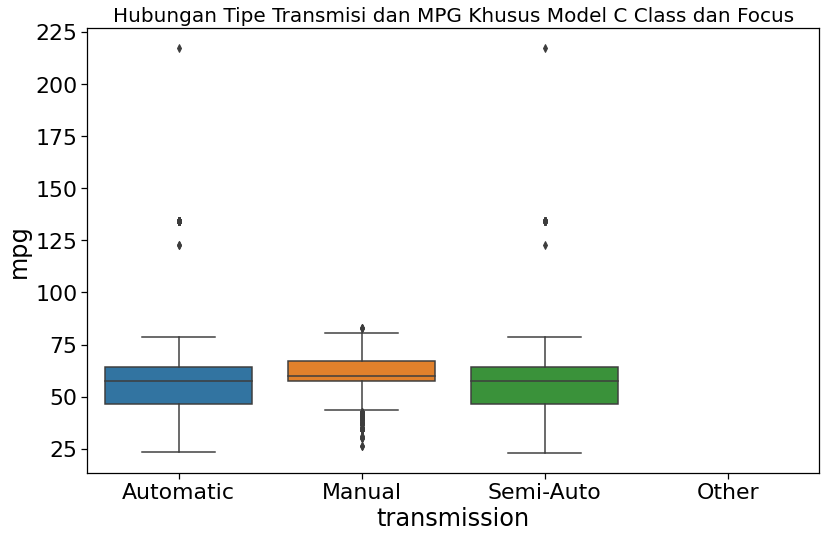

In [1397]:
## Grafik hubungan transmission dengan MPG mobil Focus dan C Class

plt.figure(figsize=(12,8))
sns.boxplot(x='transmission',y='mpg', data=df[df['model'].isin(['C Class','Focus'])])
plt.title("Hubungan Tipe Transmisi dan MPG Khusus Model C Class dan Focus", size = 20)
plt.tight_layout()

Terlihat dari boxplot di atas bahwa transmisi tidak mempunyai pengaruh yang signifikan ke mpg mobil C Class dan Focus.

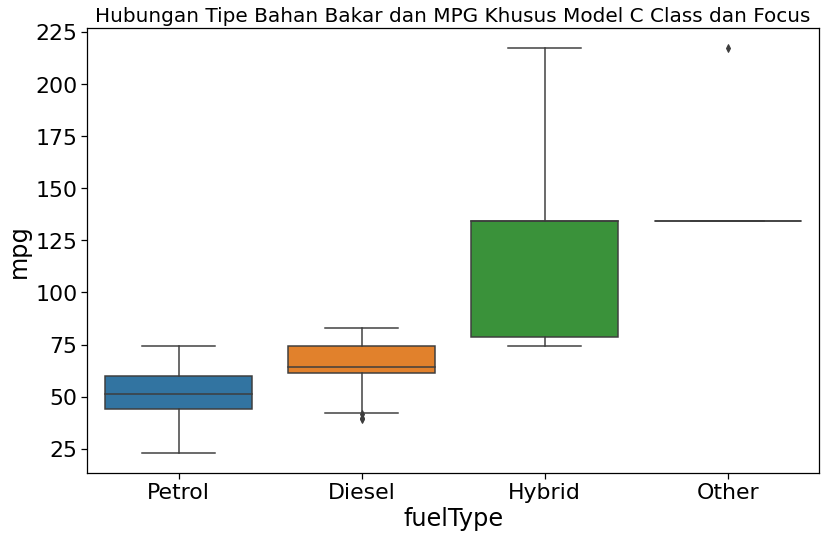

In [1398]:
## Grafik hubungan fuelType dengan MPG mobil C Class dan Focus

plt.figure(figsize=(12,8))
sns.boxplot(x='fuelType',y='mpg', data=df[df['model'].isin(['C Class','Focus'])])
plt.title("Hubungan Tipe Bahan Bakar dan MPG Khusus Model C Class dan Focus", size = 20)
plt.tight_layout()

Terlihat dari grafik di atas bahwa untuk mobil Focus dan C Class mempunyai mpg yang cenderung besar untuk tipe bahan bakar Hybrid, lalu disusul Diesel, dan yang terendah adalah jenis bahan bakar petrol.

In [7]:
## Define Class uintuk mengganti missing value tax dengan nilai median tax dari grup model dan tahun rilis mobil.
## Define Class uintuk mengganti missing value mpg dengan nilai median mpg dari grup model dan fuelType mobil.

from sklearn.base import BaseEstimator, TransformerMixin
class CustomImputer1(BaseEstimator, TransformerMixin):
    def __init__(self):
        super().__init__()
        self.tax_med = {}
        self.mpg_med = {}

    def fit(self, X, y=None):
        self.tax_med = X.groupby(['model', 'year']).tax.median()
        self.mpg_med = X.groupby(['model','fuelType']).mpg.median()

        return self

    def transform(self, X, y=None):
        # fill tax
        for key, value in self.tax_med.items():
            X.loc[((np.isnan(X["tax"])) & (X.model == key[0]) & (X.year == key[1])), 'tax'] = value
        # fill mpg
        for key, val in self.mpg_med.items():
            X.loc[((np.isnan(X['mpg'])) & (X.model == key[0]) & (X.fuelType == key[1])), 'mpg'] = val

        return X

In [12]:
# Instantiating Instantiating
my_CustomImputer = CustomImputer1()

In [1401]:
# Fitting operation
my_CustomImputer.fit(df)

print('Learned parameters')
print(my_CustomImputer.tax_med)
print(my_CustomImputer.mpg_med)

# Applying the CustomImputer
my_CustomImputer.transform(df)

print('\n--> After applying transform')
print('Nan count:', df.isna().sum())
print('mpg mean:', df['mpg'].mean())
print('tax mean:', df['tax'].mean())

Learned parameters
model     year
1 Series  2005    265.0
          2006    230.0
          2007    125.0
          2008    150.0
          2009    160.0
                  ...  
i8        2015      0.0
          2016      0.0
          2017      0.0
          2018    135.0
          2019    135.0
Name: tax, Length: 1533, dtype: float64
model     fuelType
1 Series  Diesel       67.3
          Petrol       44.1
180       Diesel       72.4
2 Series  Diesel       64.2
          Hybrid      141.2
                      ...  
i3        Electric    470.8
          Hybrid      470.8
          Other       470.8
i8        Hybrid      134.5
          Other       134.5
Name: mpg, Length: 372, dtype: float64

--> After applying transform
Nan count: model           0
year            0
transmission    0
mileage         0
fuelType        0
tax             8
mpg             0
engineSize      0
brand           0
price           0
dtype: int64
mpg mean: 55.34484561195602
tax mean: 120.21340058206144


Masih tersisa 8 null value pada kolom tax karena median tahun tersebut untuk model yang sama adalah 0.

In [1402]:
df[df.isna().any(axis=1)]

,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,brand,price
6065,C Class,2005,Automatic,102500,Diesel,NaN,61.4,2.1,Merc,2995
8256,C Class,2005,Automatic,66000,Diesel,NaN,61.4,2.1,Merc,2575
35695,C Class,1998,Automatic,140000,Petrol,NaN,44.8,2.0,Merc,1290
41939,Focus,2002,Manual,101000,Petrol,NaN,58.9,1.6,Ford,795
52455,C Class,1995,Automatic,173000,Petrol,NaN,44.8,3.6,Merc,4750
57269,C Class,2003,Automatic,88082,Diesel,NaN,61.4,2.1,Merc,1795
60681,C Class,2005,Automatic,110461,Diesel,NaN,61.4,2.1,Merc,2495
62498,C Class,2005,Automatic,73000,Petrol,NaN,44.8,5.4,Merc,15990


Tabel di atas adalah data tax yang masih kosong. Dan berikut adalah hasil pengecekan manual data setelah digrouping menurut model dan year. (Hanya fokus pada group yang masih null.)

In [1403]:
year_group = df[["model", "year", "tax"]].groupby(["model","year"]).median().reset_index()

print("Berikut adalah median kolom tax untuk mobil model Focus tahun 2002 : ")
print(year_group[(year_group["model"] == "Focus") & (year_group["year"] == 2002)])

print("Berikut adalah median kolom tax untuk mobil model Focus tahun 1995,1998, dan 2003 : ")
print(year_group[(year_group["model"] == "C Class") & (year_group["year"].isin([1995, 1998, 2003, 2005]))])

Berikut adalah median kolom tax untuk mobil model Focus tahun 2002 : 
     model  year  tax
561  Focus  2002  NaN
Berikut adalah median kolom tax untuk mobil model Focus tahun 1995,1998, dan 2003 : 
       model  year  tax
340  C Class  1995  NaN
341  C Class  1998  NaN
343  C Class  2003  NaN
345  C Class  2005  NaN


Terlihat bahwa nilai median masih NaN dikarenakan tidak adanya acuan mengenai median dari tax model dan tahun mobil terkait. Sehingga perlu digunakan solusi lain. <br> <br>
Sesuai dengan insight dari perbandingan kolom year terhadap tax pada penjelasan sebelumnya, untuk tahun sebelum 2005 nilai tax cenderung lebih stabil dan tidak lagi mengalami peningkatan. <br>
Sehingga grouping median dari tax untuk tahun sebelum 2005 dapat dijadikan 1 group agar nilai null value sebelum 2005 dapat terisi.

In [8]:
## Define Class uintuk mengganti missing value tax dengan nilai median tax dari grup model dan tahun rilis mobil.
## Tahun 2005 ke bawah dijadikan 1 grup yang sama

class taximputer2(BaseEstimator, TransformerMixin):
    def __init__(self):
        super().__init__()
        self.tax_med = {}

    def fit(self, X, y=None):
        self.tax_med = X.groupby(['model',lambda x: 'x' if df['year'].loc[x] < 2005 else str(df['year'].loc[x])]).tax.median()

        return self

    def transform(self, X, y=None):
        # fill tax
        X[X['tax'].isna()]['tax'] = X
            
        for key, value in self.tax_med.items():
            if key[1] == 'x':
                X.loc[((np.isnan(X["tax"])) & (X.model == key[0]) & (X.year <= 2005)), 'tax'] = value
            else:
                X.loc[((np.isnan(X["tax"])) & (X.model == key[0]) & (X.year == int(key[1]))), 'tax'] = value

        return X

In [1405]:
## Implement class

my_CustomImputer2 = taximputer2()
my_CustomImputer2.fit(df)
my_CustomImputer2.transform(df)

,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,brand,price
0,3 Series,2017,Automatic,41741,Diesel,150.0,51.4,3.0,BMW,21988
1,C Class,2016,Automatic,25000,Petrol,300.0,34.0,3.0,Merc,33500
2,GT86,2016,Manual,28321,Petrol,265.0,36.2,2.0,Toyota,15000
3,Focus,2017,Manual,23900,Petrol,145.0,60.1,1.0,Ford,10650
4,Fiesta,2016,Manual,12118,Petrol,125.0,54.3,1.2,Ford,8998
...,...,...,...,...,...,...,...,...,...,...
75940,A1,2020,Semi-Auto,5000,Petrol,145.0,44.8,1.5,Audi,23000
75941,Corsa,2017,Manual,26813,Petrol,145.0,55.4,1.4,Vauxhall,7695
75942,A1,2015,Manual,22148,Petrol,200.0,40.4,2.0,Audi,15888
75943,Mokka X,2019,Manual,18261,Petrol,145.0,39.2,1.4,Vauxhall,14420


In [1406]:
df.isna().sum()

model           0
year            0
transmission    0
mileage         0
fuelType        0
tax             0
mpg             0
engineSize      0
brand           0
price           0
dtype: int64

In [1407]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75945 entries, 0 to 75944
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         75945 non-null  object 
 1   year          75945 non-null  int64  
 2   transmission  75945 non-null  object 
 3   mileage       75945 non-null  int64  
 4   fuelType      75945 non-null  object 
 5   tax           75945 non-null  float64
 6   mpg           75945 non-null  float64
 7   engineSize    75945 non-null  float64
 8   brand         75945 non-null  object 
 9   price         75945 non-null  int64  
dtypes: float64(3), int64(3), object(4)
memory usage: 5.8+ MB


Nilai Null value sudah terisi sepenuhnya.

# EDA POST-CLEANING

In [1408]:
## Membuat group by model untuk mendapatkan count setiap model
g_model = df[["model", "brand"]].groupby("model").count().reset_index().sort_values("brand", ascending = False).head(10)
g_model.rename(columns={"brand" : "count_model"}, inplace = True)

## Membuat group by model dan transmission
g_transmission = df[["model", "transmission", "brand"]].groupby(["model", "transmission"]).count().reset_index().sort_values("brand", ascending = False)
g_transmission.rename(columns={"brand" : "count_transmission"}, inplace = True)

## Masukkan count model pada grouping g_transmission
g_result = g_transmission.merge(g_model, how='inner', on='model').sort_values("count_model", ascending = False)
 
fig = px.bar(g_result, x="model", y="count_transmission", color="transmission", text="count_transmission",
            barmode = 'stack')

fig.update_layout(
    title_text="TOP 10 Model Terpopuler dan Transmisinya",
    barmode="stack",
    xaxis_title="Model",
    yaxis_title="Jumlah Unit",

)
 
fig.show()

1. Model Fiesta merupakan model yang paling populer. Dibawahnya terdapat model Focus dan Golf yang memiliki selisih yang tipis. <br>
2. Model Fiesta didominasi oleh transmisi Manual. Lain halnya dengan model C Class yang sebagian besar memiliki transmisi Semi-Auto. <br>

In [1409]:
p_model = df[['model','price']].groupby('model').mean().reset_index().sort_values('price', ascending = False).head(10)

p_model

fig = go.Figure([
        go.Bar(
                y=p_model['price'], 
                x=p_model['model'], 
                name="total price",
                text=p_model['price'],
                textposition='auto')
        ])

fig.update_layout(
    title_text="Rata-rata Harga Penjualan untuk Setiap Model",
    barmode="stack",
    uniformtext=dict(mode="hide", minsize=10),
    xaxis_title="Model",
    yaxis_title="Total Harga",

)

fig.show()

1. Model G Class memiliki rata-rata harga mobil yang paling tinggi daripada model lainnya yaitu sekitar 100000 pounds. <br>
2. Model R8 menyusul dibelakang model G Class dengan selisih sekitar 8000 pounds. <br>
3. Sedangkan untuk selisih peringkat 2 dan 3 yaitu antara model R8 dan X7 cukup jauh yaitu sekitar 20000 pounds.

In [1410]:
n_year = df['year'].value_counts().reset_index().sort_values('index').tail(10)
m_year = df[['year', 'price']].groupby('year').mean().reset_index().sort_values('year').tail(10)


layout = go.Layout(xaxis=dict(type='category'))

fig = make_subplots(
    rows=1, cols=2, 
    start_cell="top-left",
    subplot_titles=("Tingkat Penjualan Setiap Tahun Mobil (10 Tahun Terakhir)", "Rata-rata Harga Mobil untuk Setiap Tahun Mobil (10 Tahun Terakhir)"))

fig.add_trace(
    go.Scatter(x=n_year['index'], y=n_year['year']), 
    row=1, col=1  
    )


fig.add_trace(
    go.Scatter(x=m_year['year'], y=m_year['price']),
    row=1, col=2 
    )

fig.update_layout(
    autosize=False,
    width=1600,
    height=400,
)

fig['layout']['xaxis']['title']='Year'
fig['layout']['xaxis2']['title']='Year'
fig['layout']['yaxis']['title']='Jumlah Unit'
fig['layout']['yaxis2']['title']='Rata-rata Harga'

fig.show()

1. Terdapat peningkatan pada tingkat penjualan mobil untuk setiap tahun rilis kecuali pada tahun 2018 dan 2020. <br>
2. Rata-rata harga mobil tiap tahun rilis mengalami peningkatan. <br>
3. Peningkatan rata-rata harga secara signifikan terjadi pada mobil tahun 2019.

<Figure size 1152x432 with 0 Axes>

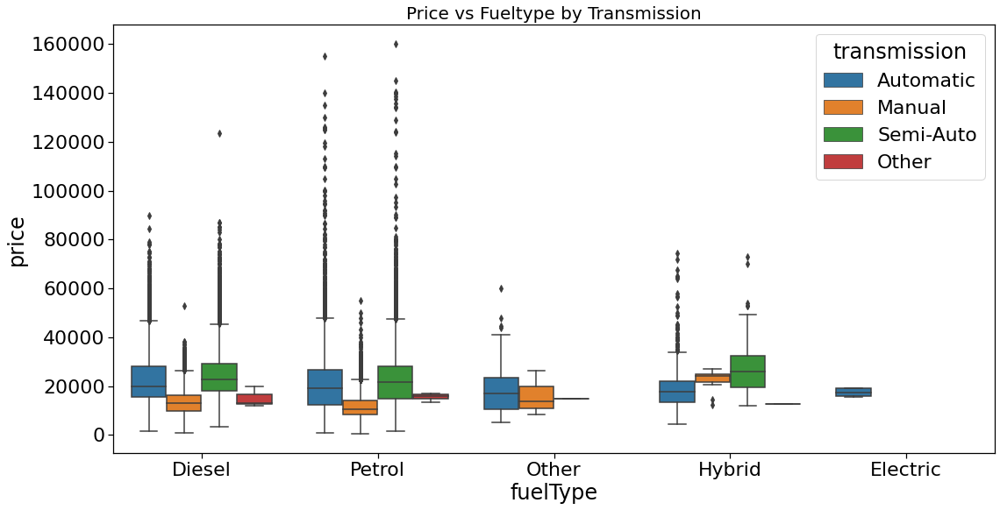

<Figure size 1152x432 with 0 Axes>

In [1411]:
plt.figure(figsize=(18, 9))
sns.boxplot(x='fuelType', y='price', data=df, hue='transmission')
plt.title('Price vs Fueltype by Transmission', size = 20)
plt.figure(figsize=(16, 6))

1. Terlihat bahwa mobil dengan bahan bakar jenis petrol mempunyai outlier yang cukup banyak dan juga mempunyai harganya mempunyai potensi untuk menjulang lebih tinggi daripada bahan bakar lain. <br>
2. Untuk bahan bakar Petrol dan Diesel, transmisi manual memiliki kecenderungan untuk mempunyai harga yang lebih rendah daripada tipe transmisi lain.
3. Tipe bahan bakar electric dan hybrid memiliki rentang harga yang lebih kecil daripada tipe bahan bakar petrol dan diesel

# Modeling

In [1412]:
from sklearn.compose import ColumnTransformer 
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from category_encoders import binary
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_log_error, mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, cross_val_score, RandomizedSearchCV

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor 
from sklearn.linear_model import LinearRegression, Lasso, SGDRegressor, ElasticNet, BayesianRidge
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
import time

In [1413]:
## Kembalikan X_train_ dan y_train dari df yang sudah dicleaning

X_train = df.drop('price',axis=1)
y_train = df['price']

## Cleaning X_train

In [1414]:
X_test.isna().sum()

model             0
year              0
transmission      0
mileage           0
fuelType          0
tax             211
mpg             211
engineSize        0
brand             0
dtype: int64

Terdapat 211 null value pada kolom tax maupun mpg pada X_test. Selanjutnya akan dilakukan fungsi customimputer pada X_test untuk mengisi kedua kolom tersebut.

In [1415]:
my_CustomImputer.fit(df)
my_CustomImputer.transform(X_test)

,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,brand
34331,KA,2014,Manual,21200,Petrol,30.0,57.7,1.2,Ford
61128,Auris,2019,Automatic,16039,Hybrid,135.0,65.6,1.8,Toyota
4161,A6,2016,Semi-Auto,19862,Diesel,145.0,56.5,2.0,Audi
82861,Polo,2017,Manual,14000,Petrol,145.0,58.9,1.0,VW
86276,Tiguan,2017,Automatic,16953,Diesel,145.0,49.6,2.0,VW
...,...,...,...,...,...,...,...,...,...
7475,A1,2016,Manual,48090,Petrol,30.0,55.4,1.4,Audi
12703,2 Series,2019,Automatic,2766,Petrol,145.0,50.4,2.0,BMW
53752,Kodiaq,2019,Automatic,3500,Diesel,145.0,37.2,2.0,Skoda
13665,2 Series,2016,Automatic,11854,Diesel,145.0,55.4,2.0,BMW


In [1416]:
X_test.isna().sum()

model           0
year            0
transmission    0
mileage         0
fuelType        0
tax             0
mpg             0
engineSize      0
brand           0
dtype: int64

Sudah tidak ada null value pada X_test

In [1417]:
res = pd.DataFrame(columns=['Regressor', 'R-squared', 'r2 std','MAPE', 'mape std', 'MSE', 'mse std', 'time execution'])

In [1418]:
##set encode

bin_col = []
onehot_col = []

## Apablia jumlah data unik di atas 6, maka 
for i in X.select_dtypes(include='object').columns:
    if X[i].nunique() > 6:
        bin_col.append(i)
    else:
        onehot_col.append(i)

In [1426]:
X_train

,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,brand
0,3 Series,2017,Automatic,41741,Diesel,150.0,51.4,3.0,BMW
1,C Class,2016,Automatic,25000,Petrol,300.0,34.0,3.0,Merc
2,GT86,2016,Manual,28321,Petrol,265.0,36.2,2.0,Toyota
3,Focus,2017,Manual,23900,Petrol,145.0,60.1,1.0,Ford
4,Fiesta,2016,Manual,12118,Petrol,125.0,54.3,1.2,Ford
...,...,...,...,...,...,...,...,...,...
75940,A1,2020,Semi-Auto,5000,Petrol,145.0,44.8,1.5,Audi
75941,Corsa,2017,Manual,26813,Petrol,145.0,55.4,1.4,Vauxhall
75942,A1,2015,Manual,22148,Petrol,200.0,40.4,2.0,Audi
75943,Mokka X,2019,Manual,18261,Petrol,145.0,39.2,1.4,Vauxhall


In [1425]:
y_train

0        21988
1        33500
2        15000
3        10650
4         8998
         ...  
75940    23000
75941     7695
75942    15888
75943    14420
75944    22515
Name: price, Length: 75945, dtype: int64

In [1431]:
## Percobaan menggunakan 10 metode

Regressor = {
    'RandomForest': RandomForestRegressor(),
    'DecissionTree': DecisionTreeRegressor(),
    'Lasso': Lasso(),
    'Linreg': LinearRegression(),
    'MLP': MLPRegressor(),
    'KNN': KNeighborsRegressor(),
    'StochasticGradientDescent': SGDRegressor(),
    'ElasticNet': ElasticNet(),
    'Bayesian': BayesianRidge(),
    'GradientBoost': GradientBoostingRegressor()
}

for rgs in Regressor:
    start = time.time()

    ## Apply encoder
    encode = ColumnTransformer(
        transformers=[
            ('one hot encoder', OneHotEncoder(drop = 'first'), onehot_col),
            ('binary', binary.BinaryEncoder(), bin_col)
            ], remainder= 'passthrough')


    model = Pipeline(
        steps=[
            ('preprocessor', encode),
            ('model', Regressor[rgs])
        ]
    )
    scoring = ['r2','neg_mean_absolute_percentage_error','neg_mean_squared_error']
    ##Crossval
    c_score = cross_validate(model, X_train, y_train, cv=5,  scoring=scoring)
    time_exect = time.time()-start
    
    row = {
        'Regressor': rgs,
        'R-squared': np.mean(c_score['test_r2']),
        'r2 std': np.std(c_score['test_r2']),
        'MAPE': np.mean(c_score['test_neg_mean_absolute_percentage_error']) , 
        'mape std': np.std(c_score['test_neg_mean_absolute_percentage_error']) ,
        'MSE': np.mean(c_score['test_neg_mean_squared_error']) , 
        'mse std': np.std(c_score['test_neg_mean_squared_error']) ,
        'time execution': round(time_exect,2)
    }

    res = res.append(row, ignore_index=True)

In [37]:
res['MAPE'] = res['MAPE'].apply(lambda x: abs(x))
res.sort_values(['R-squared'], ascending=False)

,Regressor,R-squared,r2 std,MAPE,mape std,MSE,mse std,time execution
0,RandomForest,9.557356e-01,5.623391e-03,7.671392e-02,1.009876e-03,-4.310978e+06,5.903947e+05,117.72
1,DecissionTree,9.239380e-01,7.442751e-03,9.659324e-02,1.478945e-03,-7.400638e+06,7.517337e+05,2.71
9,GradientBoost,8.952466e-01,5.066799e-03,1.368230e-01,1.690931e-03,-1.019680e+07,6.303304e+05,55.16
4,MLP,8.186227e-01,1.071062e-02,1.982301e-01,7.492783e-03,-1.765568e+07,1.247397e+06,394.21
8,Bayesian,7.595730e-01,1.391180e-02,2.448782e-01,9.353468e-03,-2.340045e+07,1.589637e+06,1.25
2,Lasso,7.595695e-01,1.388231e-02,2.449142e-01,9.340336e-03,-2.340091e+07,1.588622e+06,1.64
3,Linreg,7.595616e-01,1.395583e-02,2.448561e-01,9.354500e-03,-2.340153e+07,1.593011e+06,1.08
7,ElasticNet,6.246749e-01,9.824519e-03,2.658555e-01,3.908812e-03,-3.653972e+07,1.782672e+06,1.34
5,KNN,4.331883e-01,1.059449e-02,3.756252e-01,3.687758e-03,-5.514017e+07,1.369421e+06,88.03
6,StochasticGradientDescent,-7.459636e+26,1.410108e+27,1.241628e+13,1.593760e+13,-6.870934e+34,1.293302e+35,8.49


Terlihat dari tabel di atas bahwa secara default RandomForest memiliki R square yang paling besar.
Dari hasil tersebut, kami memilih 3 metode yang terbaik yaitu RandomForest, DecisionTree, dan GradientBoost untuk dilakukan hyperparameter.

# Metode GradientBoost Regressor

## GradientBoost Gridsearch Hyperparameter Tuning

In [924]:
tuning_res = pd.DataFrame(columns=['Regressor', 'Tune', 'r2 score','MAPE', 'total duration','Best r2'])

In [1429]:
start = time.time()

parameters_grid = {
    "model__n_estimators":[100,150,200],
    "model__max_depth":[1,3,5]
}

encode = ColumnTransformer(
    transformers=[
        ('one hot encoder', OneHotEncoder(drop = 'first'), onehot_col),
        ('binary', binary.BinaryEncoder(), bin_col)
        ], remainder= 'passthrough')


model = Pipeline(
    steps=[
        ('preprocessor', encode),
        ('model', GradientBoostingRegressor())
    ]
)


gbr_gs=GridSearchCV(model, parameters_grid, scoring='r2', n_jobs=-1, cv=5, verbose=False)
gbr_gs.fit(X_train, y_train)

time_exect = time.time()-start

MAPE = mean_absolute_percentage_error(y_test, gbr_gs.predict(X_test))

In [1430]:
row ={
    'Regressor': 'GradientBoost',
    'Tune': 'Gridsearch',
    'r2 score': gbr_gs.predict(X_test),
    'MAPE': MAPE,
    'total duration': time_exect,
    'time execution': np.mean(gbr_gs.cv_results_['mean_fit_time']),
    'Best r2': gbr_gs.best_score_
}

tuning_res = tuning_res.append(row, ignore_index=True)
print("Best R-squared {:.3f} params {}".format(gbr_gs.best_score_, gbr_gs.best_params_))

Best R-squared 0.946 params {'model__max_depth': 5, 'model__n_estimators': 200}


## GradientBoost Randomsearch Hyperparameter Tuning

In [1433]:
start = time.time()

parameters = {
    "model__n_estimators":[100,150,200],
    "model__max_depth":[1,3,5]
}

encode = ColumnTransformer(
    transformers=[
        ('one hot encoder', OneHotEncoder(drop = 'first'), onehot_col),
        ('binary', binary.BinaryEncoder(), bin_col)
        ], remainder= 'passthrough')


model = Pipeline(
    steps=[
        ('preprocessor', encode),
        ('model', GradientBoostingRegressor())
    ]
)

gbr_rs=RandomizedSearchCV(model, parameters,n_iter=10, scoring='r2',n_jobs=-1, cv=5, verbose=False, random_state=101)
gbr_rs.fit(X_train, y_train)

time_exect = time.time()-start

MAPE = mean_absolute_percentage_error(y_test, gbr_rs.predict(X_test))

In [1434]:
row ={
    'Regressor': 'GradientBoost',
    'Tune': 'RandomSearch',
    'r2 score': np.mean(gbr_rs.predict(X_test)),
    'MAPE': MAPE,
    'time duration': time_exect,
    'time execution': np.mean(gbr_rs.cv_results_['mean_fit_time']),
    'Best r2': gbr_rs.best_score_
}

tuning_res = tuning_res.append(row, ignore_index=True)
print("Best R-squared {:.3f} params {}".format(gbr_rs.best_score_, gbr_rs.best_params_))

Best R-squared 0.946 params {'model__n_estimators': 200, 'model__max_depth': 5}


# Decision Tree

## Decision Tree Gridsearch

In [1435]:
start = time.time()

parameters_grid={"model__min_weight_fraction_leaf":np.linspace(0,.9,3),
                 "model__max_features":["auto",None],
                 "model__max_leaf_nodes":[None,10,30,50,70,90] }

encode = ColumnTransformer(
    transformers=[
        ('one hot encoder', OneHotEncoder(drop = 'first'), onehot_col),
        ('binary', binary.BinaryEncoder(), bin_col)
        ], remainder= 'passthrough')


model = Pipeline(
    steps=[
        ('preprocessor', encode),
        ('model', DecisionTreeRegressor())
    ]
)

dt_gs=GridSearchCV(model, parameters_grid, scoring='r2', n_jobs=-1, cv=5, verbose=False)
dt_gs.fit(X_train, y_train)

time_exect = time.time()-start

In [1436]:
MAPE = mean_absolute_error(y_test, dt_gs.predict(X_test))

row ={
    'Regressor': 'DecisionTree',
    'Tune': 'GridSearch',
    'r2 score': np.mean(dt_gs.predict(X_test)),
    'MAPE': MAPE,
    'total duration': time_exect,
    'time execution': np.mean(dt_gs.cv_results_['mean_fit_time']),
    'Best r2': dt_gs.best_score_
}

tuning_res = tuning_res.append(row, ignore_index=True)
print("Best R-squared {:.3f} params {}".format(dt_gs.best_score_, dt_gs.best_params_))

Best R-squared 0.928 params {'model__max_features': 'auto', 'model__max_leaf_nodes': None, 'model__min_weight_fraction_leaf': 0.0}


## Decision Tree Randomsearch

In [1437]:
start = time.time()

parameters={"model__min_weight_fraction_leaf":np.linspace(0,.9,3),
            "model__max_features":["auto",None],
            "model__max_leaf_nodes":[None,10,30,50,70,90]}

encode = ColumnTransformer(
    transformers=[
        ('one hot encoder', OneHotEncoder(drop = 'first'), onehot_col),
        ('binary', binary.BinaryEncoder(), bin_col)
        ], remainder= 'passthrough')


model = Pipeline(
    steps=[
        ('preprocessor', encode),
        ('model', DecisionTreeRegressor())
    ]
)

dt_rs=RandomizedSearchCV(model, parameters, n_iter = 20, scoring='r2',n_jobs=-1, cv=5, verbose=False, random_state=101)
dt_rs.fit(X_train, y_train)

time_exect = time.time()-start

In [1438]:
MAPE = mean_absolute_percentage_error(y_test, dt_rs.predict(X_test))

row ={
    'Regressor': 'DecisionTree',
    'Tune': 'RandomSearch',
    'r2 score': dt_rs.predict(X_test),
    'MAPE': MAPE,
    'time duration': time_exect,
    'time execution': np.mean(dt_rs.cv_results_['mean_fit_time']),
    'Best r2': dt_rs.best_score_
}

tuning_res = tuning_res.append(row, ignore_index=True)
print("Best R-squared {:.3f} params {}".format(dt_rs.best_score_, dt_rs.best_params_))

Best R-squared 0.928 params {'model__min_weight_fraction_leaf': 0.0, 'model__max_leaf_nodes': None, 'model__max_features': None}


# Random Forest

## Random Forest Gridsearch

In [1439]:
start = time.time()
rf_param_grid = {'model__max_features': ['auto', 'sqrt'],
                 'model__n_estimators': np.linspace(10,100,5, dtype = int)}

encode = ColumnTransformer(
    transformers=[
        ('one hot encoder', OneHotEncoder(drop = 'first'), onehot_col),
        ('binary', binary.BinaryEncoder(), bin_col)
        ], remainder= 'passthrough')


model = Pipeline(
    steps=[
        ('preprocessor', encode),
        ('model', RandomForestRegressor())
    ]
)

rf_gs=GridSearchCV(model, rf_param_grid, scoring='r2', n_jobs=-1, cv=5, verbose=False)
rf_gs.fit(X_train, y_train)

time_exect = time.time()-start

In [1440]:
MAPE = mean_absolute_percentage_error(y_test, rf_gs.predict(X_test))

row ={
    'Regressor': 'RandomForest',
    'Tune': 'GridSearch',
    'r2 score': np.mean(rf_gs.predict(X_test)),
    'MAPE': MAPE,
    'time duration': time_exect,
    'time execution': np.mean(rf_gs.cv_results_['mean_fit_time']),
    'Best r2': rf_gs.best_score_
}

tuning_res = tuning_res.append(row, ignore_index=True)
print("Best R-squared {:.3f} params {}".format(rf_gs.best_score_, rf_gs.best_params_))

Best R-squared 0.958 params {'model__max_features': 'sqrt', 'model__n_estimators': 100}


## Random Forest randomsearch

In [1441]:
from scipy.stats import randint

start = time.time()
rf_param_rand = {'model__max_features': ['auto', 'sqrt'],
                 'model__n_estimators': randint(10, 200)}

encode = ColumnTransformer(
    transformers=[
        ('one hot encoder', OneHotEncoder(drop = 'first'), onehot_col),
        ('binary', binary.BinaryEncoder(), bin_col)
        ], remainder= 'passthrough')


model = Pipeline(
    steps=[
        ('preprocessor', encode),
        ('model', RandomForestRegressor())
    ]
)

rf_rs=RandomizedSearchCV(model, rf_param_rand, n_iter = 15, scoring='r2',n_jobs=-1, cv=5, verbose=False, random_state=101)
rf_rs.fit(X_train, y_train)

time_exect = time.time()-start

In [1442]:
MAPE = mean_absolute_percentage_error(y_test, rf_rs.predict(X_test))

row ={
    'Regressor': 'RandomForest',
    'Tune': 'RandomSearch',
    'r2 score': np.mean(rf_rs.predict(X_test)),
    'MAPE': MAPE,
    'time duration': time_exect,
    'time execution': np.mean(rf_rs.cv_results_['mean_fit_time']),
    'Best r2': rf_rs.best_score_
}

tuning_res = tuning_res.append(row, ignore_index=True)
print("Best R-squared {:.3f} params {}".format(rf_rs.best_score_, rf_rs.best_params_))

Best R-squared 0.959 params {'model__max_features': 'sqrt', 'model__n_estimators': 147}


In [1448]:
tuning_res = tuning_res[["Regressor", "Tune", "Best r2", "time execution"]].sort_values("Best r2", ascending = False)
tuning_res

,Regressor,Tune,Best r2,time execution
5,RandomForest,RandomSearch,0.958917,30.195043
4,RandomForest,GridSearch,0.958240,21.506764
1,GradientBoost,RandomSearch,0.946350,44.055869
0,GradientBoost,Gridsearch,0.946337,44.367783
3,DecisionTree,RandomSearch,0.928178,0.569102
2,DecisionTree,GridSearch,0.928123,0.621805


Dari hasil hyperparameter tuning, maka diplih model RandomForest dengan Tune menggunakan Tuning RandomSearch.

# Uji Kebaikan Model pada Test set yang Dibuat Menggunakan Traintestsplit

In [1471]:
# R-Squared
y_pred_test = rf_rs.predict(X_test)
r2 = r2_score(y_pred_test, y_test)
r2

0.9550203522489796

In [1472]:
# MAPE
mape = mean_absolute_percentage_error(y_pred_test, y_test)
mape

0.0690666147707274

### Dari pengujian pada test set menunjukkan kalau model yang dipakai mempunyai R-squared 95% dan MAPE sekitar 6,9%

In [1473]:
y_resid_test = y_test-y_pred_test
index_pred = X_test.index 

y_pred_series = pd.Series(data=y_pred_test, index=index_pred)
index_test = {}

brand_test = X_test.brand.unique()

for i in brand_test :
    index_test[i] = X_test[X_test['brand'] == i].index 


In [1452]:
y_pred_brand = {}
y_resid_brand = {}

for i in brand_test :
    y_pred_brand[i] = y_pred_series.loc[index_test[i]]
    y_resid_brand[i] = y_resid_test.loc[index_test[i]]

In [1453]:
y_resid_brand['Audi']/y_pred_brand['Audi']

4161   -0.038559
8361   -0.104939
2757   -0.141234
6664    0.010380
3139    0.044533
          ...   
4132   -0.123377
7241   -0.061594
1289   -0.055733
8289   -0.166972
7475    0.151022
Length: 1435, dtype: float64

In [1454]:
for i in brand_test :
    mape_brand = sum(abs(y_resid_brand[i]/y_pred_brand[i]))/len(y_pred_brand[i])*100
    print(f"Untuk Brand {i}, mempunyai MAPE sebesar : {round(mape_brand, 2)} %\n")

Untuk Brand Ford, mempunyai MAPE sebesar : 7.2 %

Untuk Brand Toyota, mempunyai MAPE sebesar : 6.71 %

Untuk Brand Audi, mempunyai MAPE sebesar : 6.9 %

Untuk Brand VW, mempunyai MAPE sebesar : 6.44 %

Untuk Brand Vauxhall, mempunyai MAPE sebesar : 7.41 %

Untuk Brand Skoda, mempunyai MAPE sebesar : 7.08 %

Untuk Brand Merc, mempunyai MAPE sebesar : 6.61 %

Untuk Brand BMW, mempunyai MAPE sebesar : 6.83 %

Untuk Brand Hyundi, mempunyai MAPE sebesar : 6.85 %



Dari hasil perhitungan MAPE pada setiap Brand diperoleh angka MAPE berkisar 6.44% - 7.41%. Menjadi catatan bahwa Brand Vauxhall dan Ford mempunyai MAPE yang paling besar dibanding brand lain.

# Pengaplikasian Model di simulasi real world

Berikut adalah data final test yang akan dijadikan simulasi. Data ini sudah dibagi di awal proses.

In [1457]:
df_finaltest

,index,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
0,2306,A1,2013,9750,Manual,29773,Petrol,125,52.3,1.4,Audi
1,5549,A3,2017,18900,Manual,10950,Petrol,150,54.3,1.5,Audi
2,10483,A3,2019,21000,Manual,3000,Diesel,145,52.3,1.6,Audi
3,4504,Q5,2019,31490,Automatic,6000,Diesel,145,39.2,2.0,Audi
4,779,A5,2015,14998,Manual,32125,Diesel,125,57.6,2.0,Audi
...,...,...,...,...,...,...,...,...,...,...,...
10850,11682,Tiguan,2015,12799,Manual,42030,Diesel,160,48.7,2.0,VW
10851,3464,Golf,2016,12190,Manual,24397,Diesel,20,68.9,2.0,VW
10852,12114,Sharan,2017,20990,Automatic,20000,Diesel,150,53.3,2.0,VW
10853,11850,Tiguan,2016,11995,Manual,11000,Diesel,145,53.3,2.0,VW


## Proses Cleaning Data

In [1459]:
df_finaltest.describe()

,index,mpg,engineSize
count,10855.000000,9939.000000,10855.000000
mean,7287.720405,55.214800,1.652796
std,5374.839137,15.872928,0.546064
min,3.000000,2.800000,0.000000
25%,2989.000000,47.100000,1.200000
50%,6162.000000,54.300000,1.600000
75%,10531.000000,62.800000,2.000000
max,23390.000000,470.800000,6.200000


Terlihat bahwa engineSize mempunyai minimal 0 yang berarti harus dilihat lagi tipe transmisi mobil yang mempunyai nilai tersebut.

In [1460]:
df_finaltest.isna().sum()

index             0
model             0
year              0
price             0
transmission      0
mileage           0
fuelType          0
tax             916
mpg             916
engineSize        0
brand             0
dtype: int64

Terdapat 930 data null pada kolom tax dan mpg.

In [9]:
## Define Class uintuk mengganti missing value tax dengan nilai median tax dari grup model dan tahun rilis mobil.
## Define Class uintuk mengganti missing value mpg dengan nilai median mpg dari grup model dan fuelType mobil.

from sklearn.base import BaseEstimator, TransformerMixin
class CustomImputerSim(BaseEstimator, TransformerMixin):
    def __init__(self):
        super().__init__()
        self.tax_med = {}
        self.mpg_med = {}

    def fit(self, X, y=None):
        self.tax_med = X.groupby(['model', 'year']).tax.median()
        self.mpg_med = X.groupby(['model','fuelType']).mpg.median()

        return self

    def transform(self, X, y=None):
        # fill tax
        for key, value in self.tax_med.items():
            X.loc[((pd.isna(X["tax"])) & (X.model == key[0]) & (X.year == key[1])), 'tax'] = value
        # fill mpg
        for key, val in self.mpg_med.items():
            X.loc[((pd.isna(X['mpg'])) & (X.model == key[0]) & (X.fuelType == key[1])), 'mpg'] = val

        return X

In [744]:
my_ImputerSim = CustomImputerSim()

In [1462]:
# Fitting operation
my_ImputerSim.fit(df)
# Applying the CustomImputer
my_ImputerSim.transform(df_finaltest)

print('\n--> After applying transform')
print('Nan count:', df_finaltest.isna().sum())
print('mpg mean:', df_finaltest['mpg'].mean())
print('tax mean:', df_finaltest['tax'].mean())


--> After applying transform
Nan count: index           0
model           0
year            0
price           0
transmission    0
mileage         0
fuelType        0
tax             0
mpg             0
engineSize      0
brand           0
dtype: int64
mpg mean: 55.78301243666513
tax mean: 119.76209120221097


In [1484]:
df_finaltest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10855 entries, 0 to 10854
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   index         10855 non-null  int64  
 1   model         10855 non-null  object 
 2   year          10855 non-null  object 
 3   price         10855 non-null  object 
 4   transmission  10855 non-null  object 
 5   mileage       10855 non-null  object 
 6   fuelType      10855 non-null  object 
 7   tax           10855 non-null  object 
 8   mpg           10855 non-null  float64
 9   engineSize    10855 non-null  float64
 10  brand         10855 non-null  object 
dtypes: float64(2), int64(1), object(8)
memory usage: 933.0+ KB


In [1485]:
df_finaltest.reset_index(inplace = True, drop=True)

X_sim = df_finaltest.drop(['price', 'index'],axis=1)
y_sim = df_finaltest[['price']]

In [1486]:
## Mendapatkan kebaikkan model yang telah dibuat
y_pred_sim = rf_rs.predict(X_sim)
r2 = r2_score(y_sim, y_pred_sim)
r2

0.9631558244974364

In [1499]:
#menghitung mean absolute error dari data test pada trainset untuk dijadikan batas bawah dan batas atas harga jual
mape_sim = mean_absolute_percentage_error(y_pred_sim, y_sim)
mape_sim

0.06969534656322103

Dari model yang dihasilkan, didapatkan R Squared sebesar 96% dan MAPE sebanyak 6,9% (Jika dibandingkan dengan harga yang sebenarnya di data simulasi)

In [1489]:
#membuat dataframe berisi price, prediction_price, lower_bound, upper_bound
# Running Model on Data

list_mobil = pd.merge(X_sim,y_sim,left_index=True, right_index=True)
list_mobil['prediction_price'] = rf_rs.predict(X_sim)
list_mobil['lower bound'] = list_mobil['prediction_price'] - mae
list_mobil['upper bound'] = list_mobil['prediction_price'] + mae

toBuy = list_mobil[list_mobil['price']<list_mobil['lower bound']].copy()
toBuy['low_profit'] = toBuy['lower bound']-toBuy['price']
toBuy['high_profit'] = toBuy['upper bound']-toBuy['price']

Berikut adalah daftar mobil yang dapat dibeli beserta batas atas dan batas bawah dari harga jual berikut bersama potensi keuntungan tiap unit terjual :

In [1490]:
toBuy

,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,brand,price,prediction_price,lower bound,upper bound,low_profit,high_profit
8,A6,2019,Automatic,3545,Diesel,145,47.9,2.0,Audi,28800,31363.676304,30233.581244,32493.771363,1433.581244,3693.771363
10,A4,2018,Semi-Auto,16000,Petrol,150,42.8,2.0,Audi,22900,24437.136054,23307.040995,25567.231114,407.040995,2667.231114
11,TT,2015,Manual,64850,Petrol,145,47.9,2.0,Audi,13500,15290.074830,14159.979770,16420.169889,659.97977,2920.169889
16,A4,2018,Semi-Auto,9296,Petrol,150,53.3,1.4,Audi,17495,19642.360544,18512.265485,20772.455604,1017.265485,3277.455604
17,Q5,2019,Semi-Auto,6024,Diesel,145,38.2,2.0,Audi,32576,35701.564626,34571.469566,36831.659685,1995.469566,4255.659685
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10835,Tiguan,2015,Manual,26521,Diesel,145,53.3,2.0,VW,13500,14787.761905,13657.666845,15917.856964,157.666845,2417.856964
10836,Polo,2017,Manual,16701,Petrol,145,60.1,1.0,VW,8998,10235.544218,9105.449158,11365.639277,107.449158,2367.639277
10838,T-Roc,2019,Semi-Auto,2966,Petrol,145,39.8,1.5,VW,22990,27105.504308,25975.409249,28235.599368,2985.409249,5245.599368
10851,Golf,2016,Manual,24397,Diesel,20,68.9,2.0,VW,12190,13982.319728,12852.224668,15112.414787,662.224668,2922.414787


Berdasarkan data tersebut, maka dapat dihitung potensi total keuntungan maksimal dan keuntungan minimal perusahaan :

In [1491]:
max_profit = np.sum(toBuy['high_profit'])
min_profit = np.sum(toBuy['low_profit'])
modal = np.sum(toBuy['price'])


print(f"Berikut adalah minimum profit yang akan diperoleh : {round(min_profit/modal*100)}%")
print(f"Berikut adalah maximum profit yang akan diperoleh : {round(max_profit/modal*100)}%")

Berikut adalah minimum profit yang akan diperoleh : 6%
Berikut adalah maximum profit yang akan diperoleh : 19%


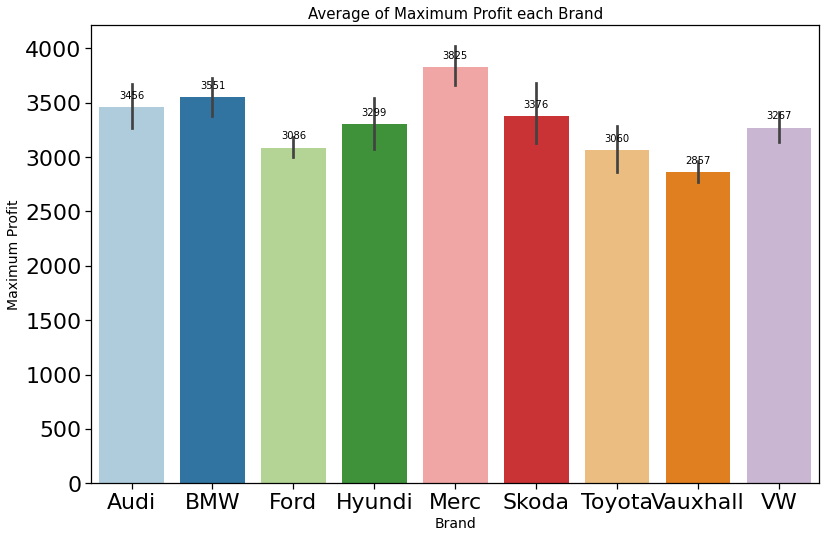

In [1492]:
fig = plt.figure(figsize=(12,8))
splot = sns.barplot(x='brand', y='high_profit',data=toBuy, 
                        palette='Paired')
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   size=10,
                   xytext = (0, 12), 
                   textcoords = 'offset points')
plt.xlabel("Brand", size=14)
plt.ylabel("Maximum Profit", size=14)
plt.title('Average of Maximum Profit each Brand', size=15)
plt.tight_layout()
plt.show()

Brand BMW dan Merc direkomendasikan untuk menjadi prioritas pembelian karena lebih berpotensi mendapatkan profit yang lebih besar daripada brand lainnya.

# KESIMPULAN

  1. Data merupakan penjualan mobil bekas di UK pada sebuah platform.
  2. Proses cleaning dilakukan dengan cara merubah data anomali pada variable tertentu dan juga mengisi null value dengan nilai tertentu.
  3. Untuk menghasilkan prediksi yang baik dilakukan seleksi model menggunakan R-squared sebagai acuan.
  4. Model terbaik yang dihasilkan adalah model dengan algoritma Random Forest dengan tuning Random Search yang menghasilkan R-squared sebesar 95% pada data test.
  5. Berdasarkan Hasil simulasi, dilakukan estimasi keuntungan yang dapat diperoleh mencapai 19%.

# Bussiness Impact

Hasil dari model dapat membantu untuk memutuskan mobil mana yang akan dibeli karena berpotensi untuk memperoleh keuntungan. Dari hasil jual kembali mobil maka perusahaan diharapkan dapat memperoleh keuntungan sebanyak 6% hingga 19%.

## Catatan

Apabila pada pasar mobil terdapat model mobil baru, maka tidak dapat langsung diterapkan di model machine learning yang telah dibuat karena diperlukan train pada data terkait sehingga direkomendasikan untuk segera dilakukan pengambilan data pada model baru tersebut.

Some session import/export thing....

In [1495]:
# import dill
# dill.dump_session('finpro.db')

### Before Load Session, please run class CustomImputer1(), taximputer2(), dan CustomImputerSim() first.

In [10]:
# import warnings
# warnings.filterwarnings('ignore')

# import dill
# dill.load_session('session/finpro.db')